# League of Legends Summer Tournament Data Analysis
By William Weihnacht and Daniel Song

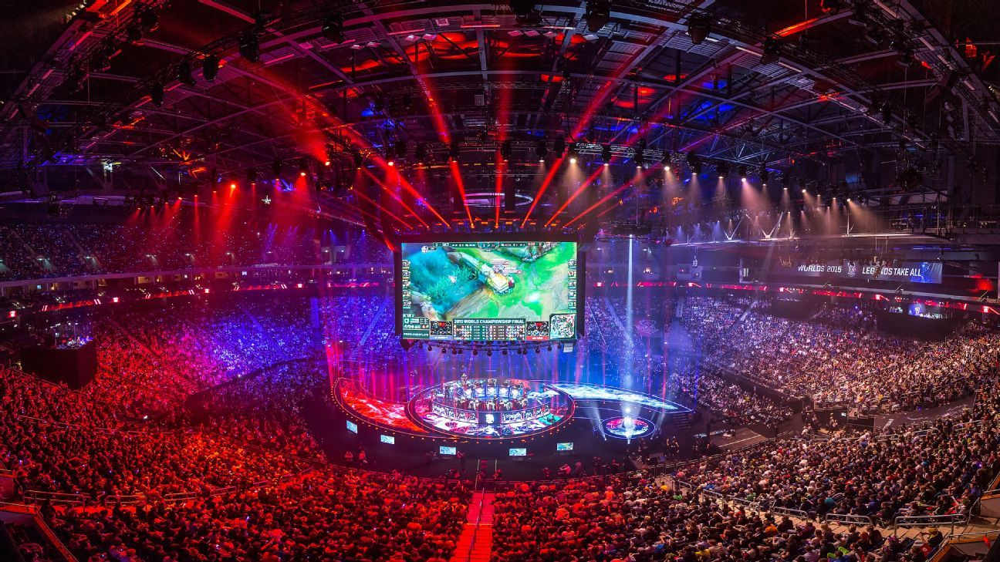

### Introduction

In recent years, League of Legends has grown not only in popularity as the most played e-sports game but also as a venue for data analytics. 
League of Legends is arguably the most played video game on PC and the most watched e-sport on the planet, with daily viewers in the hundreds of thousands on [Twitch](https://www.twitch.tv/directory/game/League%20of%20Legends). As a video game, it has intricately complex dynamics where two teams of five players each compete in a part arms-race part-battle to basically eliminate one another’s towers and central nexus. Each game is like a mini-war that usually resolves within 30 minutes to an hour depending on how quickly one team is able to gain an advantage over the other.
League of Legends currently consists of 140+ distinct champions (avatars) each with unique abilities and properties, yielding different advantages and disadvantages. And Riot Games (the creator of League of Legends) is consistently churning out new champions every few months, resulting in a constantly shifting [meta](https://boosteria.org/guides/league-meta). Each base is protected by a set of defensive towers that shoot at the first enemy they come across. The nexus, or command center, of each base generates AI-controlled minions that serve as foot soldiers for each team and are killed by the opponents to amass gold and experience points used to strengthen their abilities. The game ends when one of the Nexuses are destroyed. For more information on the rules [click here](https://na.leagueoflegends.com/en/game-info/get-started/new-player-guide/).

The dynamics of the game can become quite complicated as all these factors stack together and as such analyzing this game can be rather complicated. However, as it has arguably remained the figure head of e-sports over the past 10 or so years since its release there is a lot of scrutiny on matchup statistics and match analysis due to its size. In our project, we hope to shed some light on the driving forces of the current meta as well as model the likelihood of a team winning given their current resources.

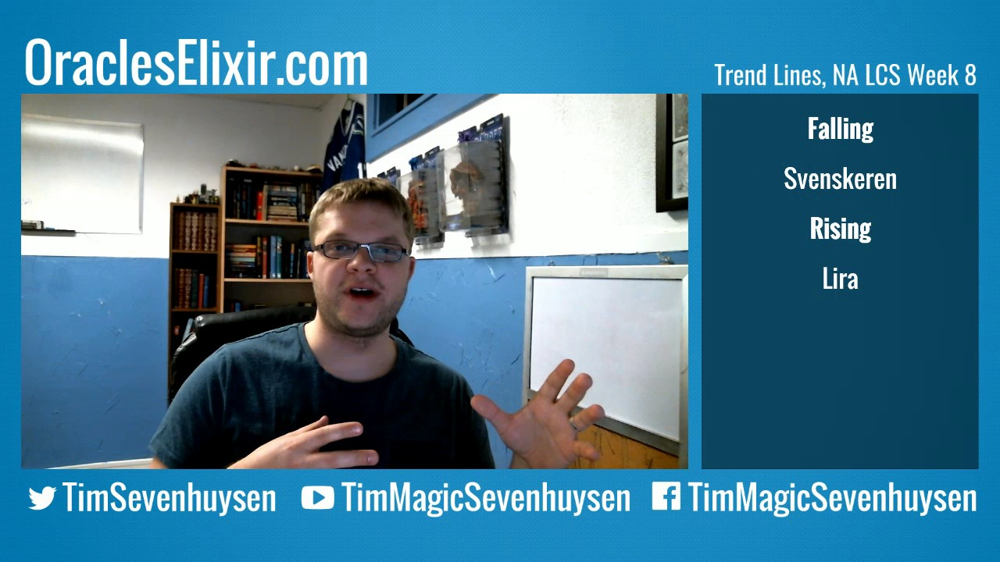

### Data collection

To collect the data for our project we were lucky in that there is a plethora of League related data widely accessible including [Riot’s](https://www.riotgames.com/en) own match data API. However, instead of scraping data from random public matches, we chose to collect data from an already existing professional League analysis website named [Oracle’s Elixir](http://oracleselixir.com/) so we can analyze the game at the highest level of play and in the current meta. This meant the main challenge here was reformatting it into a way that we wanted to use it.

Oracle's Elixir is the No. 1 LoL Esports Statistics + Analytics Website founded by Tim Sevenhuysen.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api

In [4]:
#read in dataset
data = pd.read_excel('./2019-summer-match-data-OraclesElixir-2019-06-24.xlsx')

To start off there is much more data than we need to get a good idea of the current meta game so we can go ahead and select the most relevant 45 of the 98 columns.

In [5]:
#select relevent columns
less_data = data[['date','gameid','playerid','player','team','side','gamelength','result','k','d','a','teamkills','teamdeaths','fb','kpm','okpm','fd','fdtime','teamdragkills','oppdragkills','ft','firstmidouter','firsttothreetowers','teamtowerkills','opptowerkills','fbaron','teambaronkills','oppbaronkills','dmgtochampsperminute','wpm','wcpm','totalgold','goldspent','csat10','oppcsat10','csdat10','goldat10','oppgoldat10','gdat10','goldat15','oppgoldat15','gdat15','xpat10','oppxpat10','xpdat10']]

### Data Processing

Now that we have a DataFrame full of statistics we can start to break it down into more relevant subsets. We want to look at performance based on individual champions, as well as what the most successful teams are prioritizing doing.

To get clean data for team stats we will simply select all rows where the player is listed as team, which means the column contains the team averages for that game. Once we have aggregated these we group all rows that correspond to the same team together and average them to get a table of team averages across all games this tournament. Doing so makes the variables playerid, team kills, and team deaths, redundant or obsolete so they are dropped.

All our data is grouped by teams. As a result, the different teams in our dataset serve as the index for the dataframe. This will make a difference when looking at distributions of win percentages in the machine learning section, where the distribution will show the average number of teams on the y-axis and the win percentage on the x-axis.

In [6]:
#team stats for each game
team_stats = less_data.loc[less_data['player'] == 'Team']

In [7]:
#team data averaged across all games
avg_team_data = team_stats.groupby(['team']).mean()
avg_team_data.drop(['playerid','teamkills','teamdeaths'],1,inplace=True)
avg_team_data.head()

,gamelength,result,k,d,a,kpm,okpm,fdtime,teamdragkills,oppdragkills,...,csdat10,goldat10,oppgoldat10,gdat10,goldat15,oppgoldat15,gdat15,xpat10,oppxpat10,xpdat10
team,,,,,,,,,,,,,,,,,,,,,
100 Thieves,34.847917,0.375000,9.625000,12.125000,26.000000,0.271693,0.356500,10.055717,1.250000,3.250000,...,-33.250000,14695.750000,16037.625000,-1341.875000,23126.125000,25380.750000,-2254.625000,18223.000000,18705.375000,-482.375000
AHQ e-Sports Club,36.662500,0.625000,12.625000,9.125000,29.500000,0.366591,0.250843,8.835340,3.000000,2.250000,...,-0.625000,15873.500000,15221.000000,652.500000,25036.250000,23743.625000,1292.625000,18590.375000,18360.500000,229.875000
Afreeca Freecs,33.570833,0.500000,12.312500,12.312500,28.750000,0.373947,0.366536,9.033907,2.437500,2.375000,...,14.937500,15656.125000,15645.375000,10.750000,24777.562500,24646.750000,130.812500,18476.437500,18545.875000,-69.437500
Alpha Esports,29.338095,0.428571,9.000000,11.142857,23.142857,0.302010,0.386755,7.372802,1.571429,2.285714,...,-13.857143,15398.142857,15415.428571,-17.285714,23850.142857,24148.714286,-298.571429,18245.571429,19069.428571,-823.857143
Bilibili Gaming,31.320833,0.500000,11.416667,13.000000,29.000000,0.365807,0.445617,NaN,1.416667,2.416667,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Next, we look at individual player data with the goal of finding what champions are used to the greatest effect. Some data is listed as either and empty string or a single space instead of “not a number” so we change both to NaN then drop them all at once.

In [8]:
#collect average champion data
champ_data = data[['champion','position','result','earnedgoldshare','dmgshare','wardshare']]
champ_data.replace('', np.nan, inplace=True)
champ_data.replace(' ', np.nan, inplace=True)
champ_data.dropna(inplace=True)
champ_data.head()

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4042: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  method=method)
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,champion,position,result,earnedgoldshare,dmgshare,wardshare
0,Aatrox,Top,1,0.235685,0.273088,0.201835
1,Hecarim,Jungle,1,0.176841,0.123226,0.100917
2,Sylas,Middle,1,0.254719,0.255993,0.091743
3,Varus,ADC,1,0.224666,0.253611,0.110092
4,Galio,Support,1,0.108088,0.094082,0.495413


## Initial Analysis + Data Visualization
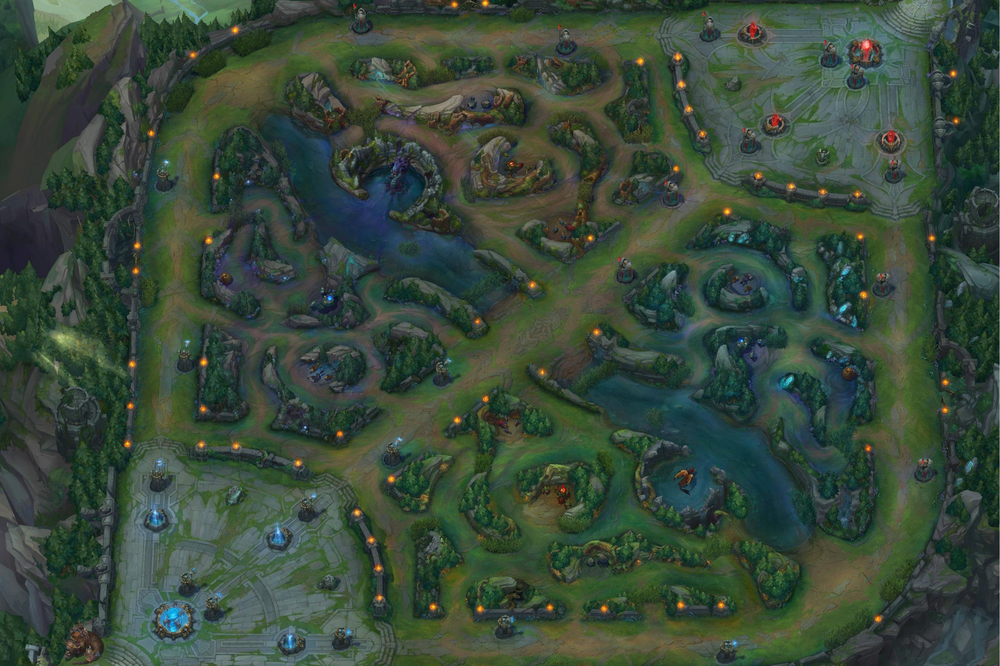

### calculate side vs win

First off, since I have seen theories that teams wearing a certain color might have a slight advantage in various sports and video games so I thought it would be interesting. I was impressed when I found that blue teams have one 55.6% of the time. After some research, I found that this is because the blue team gets to pick the first champion giving them a statistical edge in pro play.

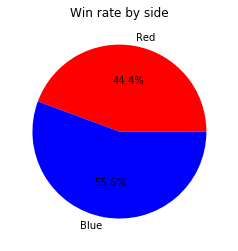

In [9]:
#calculate side vs win%
r = 0
b = 0

for index,row in team_stats.iterrows():
    if row['side'] == 'Red' and row['result'] == 1:
        r += 1
    elif row['side'] == 'Blue' and row['result'] == 1:
        b += 1
        
plt.pie([r,b],labels=['Red','Blue'],colors=['Red','Blue'],autopct='%1.1f%%')
plt.title("Win rate by side")
plt.show()

## calculate first to 3 towers vs win, first tower vs win
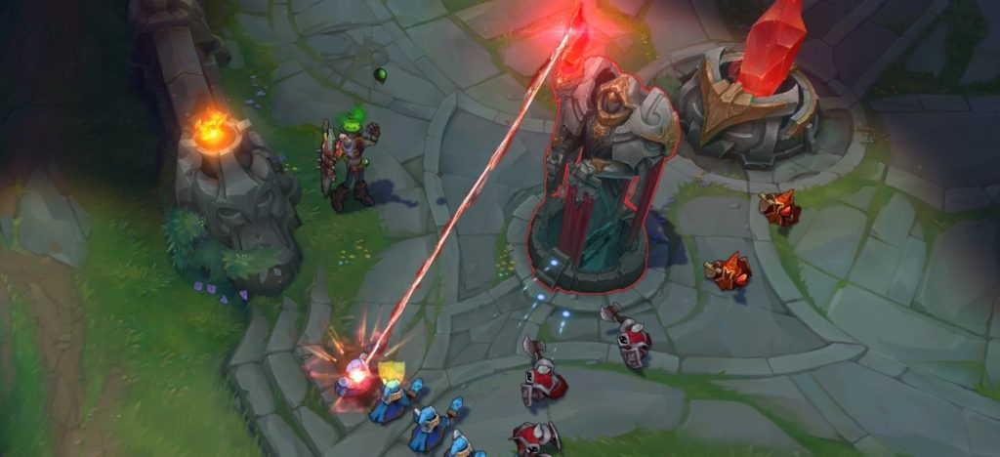

I now look at what variable present in the data would likely be the biggest indicator of winning the match: first to three towers. Since this is the minimum number of towers you must destroy to attack the main objective it makes sense that this would be a big indicator of success. We can see that being first to three towers means you have an almost 40% chance of winning.

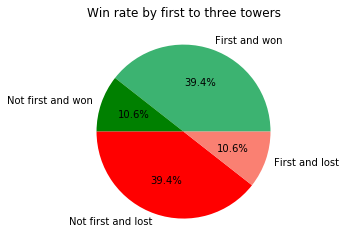

In [10]:
#calculate first to 3 towers vs win%
f_w = 0
f_l = 0
nf_w = 0
nf_l = 0

for index,row in team_stats.iterrows():
    if row['firsttothreetowers'] == 1 and row['result'] == 1:
        f_w += 1
    elif row['firsttothreetowers'] == 1 and row['result'] == 0:
        f_l += 1
    elif row['firsttothreetowers'] == 0 and row['result'] == 1:
        nf_w += 1
    elif row['firsttothreetowers'] == 0 and row['result'] == 0:
        nf_l += 1
        
plt.pie([f_w,nf_w,nf_l,f_l],labels=['First and won','Not first and won','Not first and lost','First and lost'],colors=['MediumSeaGreen','Green','Red','Salmon'],autopct='%1.1f%%')
plt.title("Win rate by first to three towers")
plt.show()

Based on this it makes sense that the first tower will give you slightly less but still significantly increased odds of winning. It’s interesting that the first tower gives an 8.7% bump but getting the next two first will only increase your chance of winning another 5.7%. This is testament to the fact that resources can be used to “snowball” an advantage and their value diminishes as time goes on.

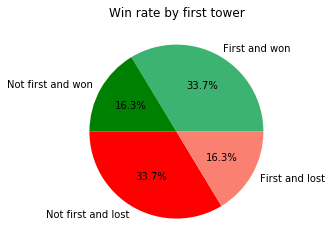

In [11]:
#calculate first tower vs win%
ft_w = 0
ft_l = 0
nft_w = 0
nft_l = 0

for index,row in team_stats.iterrows():
    if row['ft'] == 1 and row['result'] == 1:
        ft_w += 1
    elif row['ft'] == 1 and row['result'] == 0:
        ft_l += 1
    elif row['ft'] == 0 and row['result'] == 1:
        nft_w += 1
    elif row['ft'] == 0 and row['result'] == 0:
        nft_l += 1
        
plt.pie([ft_w,nft_w,nft_l,ft_l],labels=['First and won','Not first and won','Not first and lost','First and lost'],colors=['MediumSeaGreen','Green','Red','Salmon'],autopct='%1.1f%%')
plt.title("Win rate by first tower")
plt.show()

## calculate first blood vs win
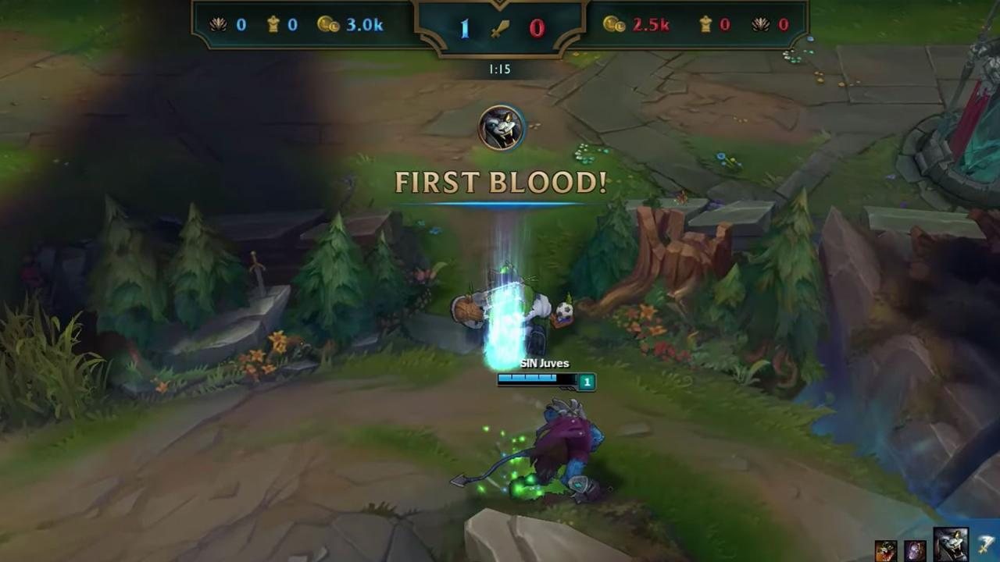

Similarly, first blood only gives a 3.6% increased chance of winning which is reasonable because it only nets you 400 gold as opposed to 1000 for a tower or 300 for a normal kill.

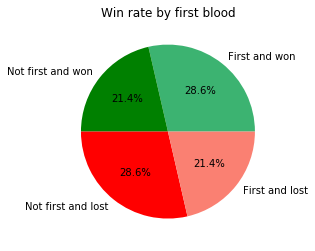

In [12]:
#calculate first blood vs win%
fb_w = 0
fb_l = 0
nfb_w = 0
nfb_l = 0

for index,row in team_stats.iterrows():
    if row['fb'] == 1 and row['result'] == 1:
        fb_w += 1
    elif row['fb'] == 1 and row['result'] == 0:
        fb_l += 1
    elif row['fb'] == 0 and row['result'] == 1:
        nfb_w += 1
    elif row['fb'] == 0 and row['result'] == 0:
        nfb_l += 1
        
plt.pie([fb_w,nfb_w,nfb_l,fb_l],labels=['First and won','Not first and won','Not first and lost','First and lost'],colors=['MediumSeaGreen','Green','Red','Salmon'],autopct='%1.1f%%')
plt.title("Win rate by first blood")
plt.show()

## calculate first dragon vs win
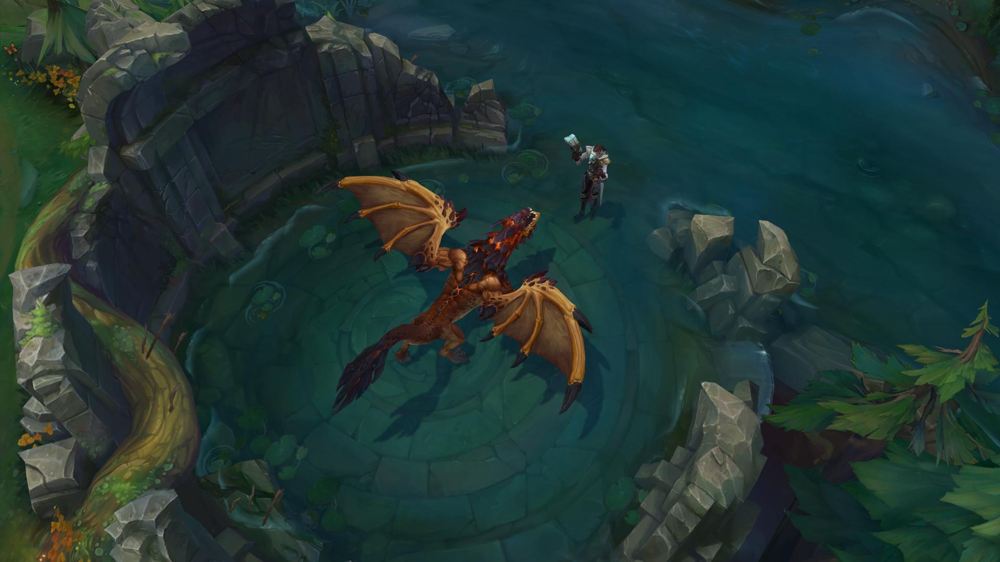

Looking at first to kill a dragon, it is more significant than first blood but less than first tower. Dragons are important for building advantages as their buff lasts the entire game but don’t give the same gold and lane control advantage as a tower.

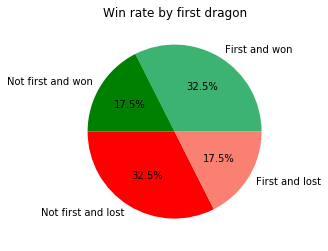

In [13]:
#calculate first dragon vs win%
fd_w = 0
fd_l = 0
nfd_w = 0
nfd_l = 0

for index,row in team_stats.iterrows():
    if row['fd'] == 1 and row['result'] == 1:
        fd_w += 1
    elif row['fd'] == 1 and row['result'] == 0:
        fd_l += 1
    elif row['fd'] == 0 and row['result'] == 1:
        nfd_w += 1
    elif row['fd'] == 0 and row['result'] == 0:
        nfd_l += 1
        
plt.pie([fd_w,nfd_w,nfd_l,fd_l],labels=['First and won','Not first and won','Not first and lost','First and lost'],colors=['MediumSeaGreen','Green','Red','Salmon'],autopct='%1.1f%%')
plt.title("Win rate by first dragon")
plt.show()

## individual role/champion data
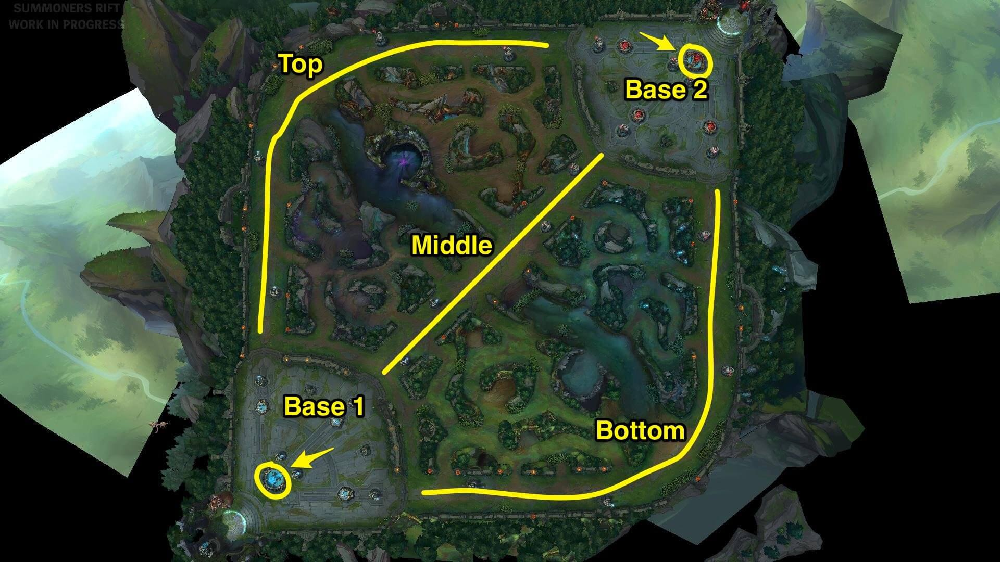

Next, we will look at individual role/champion data. First, I count the amount of times each champion was played at a certain position and remove champions who were not used at least 10 times in a position. Since we are dealing with averages having outliers such as a champion who was used once at position and won would skew the data.

The Support and ADC (usually a melee range champion) operate in the bottom lane.
The remaining roles are named after the lanes/area they operate in:
Top operates in the top lane.
Mid operates in the middle lange.
Jungle can operate in all lanes when wanting to support his/her teammates but mainly operates in the jungle (forested areas in between the lanes).

## Tidying champion data

In [14]:
#count each time a champion was picked for each position
pick_counts = champ_data.groupby(['position','champion']).size()

In [15]:
#remove data for champions used less than 10 times at a given position
champ_data2 = []
for index,row in champ_data.iterrows():
    if pick_counts[row['position']][row['champion']] > 10:
        champ_data2.append(row)
        
champ_data2 = pd.DataFrame(champ_data2)

Here I group the data by position and champion and average it, rename result to win percent for clarity, and then split the DataFrame by position played, and made a little function to graph each position cleanly.

In [16]:
#Average the data
avg_position_data = champ_data2.groupby(['position','champion']).mean()
avg_position_data.rename({'result':'Win Percent'},inplace=True,axis=1)

In [17]:
#Split the data by position
top,mid,adc,jg,sup = [],[],[],[],[]
for index,row in avg_position_data.iterrows():
    if index[0] == "ADC":
        adc.append(row)
    if index[0] == "Jungle":
        jg.append(row)
    if index[0] == "Middle":
        mid.append(row)
    if index[0] == "Support":
        sup.append(row)
    if index[0] == "Top":
        top.append(row)

In [18]:
#function to clean the data for graphing
def reindex(pos):
    df = pd.DataFrame(pos)
    i = []
    for index,row in df.iterrows():
        i.append(index[1])
    df.index = i
    return df

In [19]:
#applying the function to the dataframes created
top = reindex(top)
mid = reindex(mid)
adc = reindex(adc)
jg = reindex(jg)
sup = reindex(sup)

### Champion stats for the position top

In the top position the big winner jumps out a Sylas with a win percentage of over 60% over 24 games. Sylas was a strong Mid-lanner in patch 9.1 but it is a testament to his utility that he is used in top lane too. Interestingly the overall damage and gold share of the most successful heroes in this rank is lower than that of the more middle of the pack ones which makes sense in a way because top is an isolated position and one can have success in their own lane despite their team losing control in other lanes.

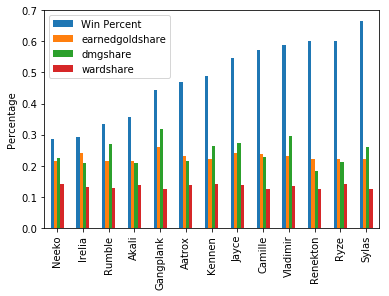

In [20]:
top.sort_values('Win Percent').plot.bar()
plt.ylabel("Percentage")
plt.show()

### Champion stats for the position middle

In the middle role, we see Sylas is also dominant here, but on par with Yasuo, another strong pick. There is a lot of variety in this position and some overlap with top as they have similar roles. Akali, for example is used in both but to more success in middle than top likely because she is more of a [ganker](http://team-dignitas.net/articles/blogs/League-of-Legends/10864/a-guide-to-ganking-in-league-of-legends) (ganking refers to ambushing an enemy in a different lane). Once again some of the lower win-rate heroes have good damage and gold share but this can once again potentially be attributed to the bottom-lane failing to over-power the enemy and being pushed in, leading to higher proportional sucsess from the more individual middle and top lanes.

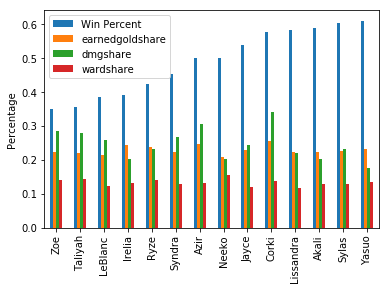

In [21]:
mid.sort_values('Win Percent').plot.bar()
plt.ylabel("Percentage")
plt.show()

The ADC role appears to have more of a set meta with only 8 commonly used champions as opposed to the 15 used at middle. ADC, which stands for attack damage carry, is tasked with outputting the majority of team damage towards the end of the game. While Kalista has by far the highest win rate this can be a little deceiving as she was only used 11 times compared to the 92 of Sivir and 90 of Xayah. With a respectable win rate of 55% in 28 games Varus seems to be one of the stronger damage dealers at this position, while the supposedly meta aformentioned Xayah and Sivir saw mediocre win rates.

### Champion stats for the position ADC

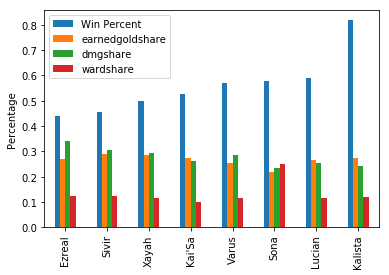

In [22]:
adc.sort_values('Win Percent').plot.bar()
plt.ylabel("Percentage")
plt.show()

### Champion stats for the position jungle

Junglers are tasked with killing their jungles spawns, stealing the enemies, and ganking. Once again, Karthus has a deceptively high win rate given he has only played 11 games but nonetheless he is an effective damage dealer but lacks the utility of other champions. Trundle is also effective although he lacks damage he provides utility by hindering the enemies in gank situations to secure extra kills, accounting for his low damage share yet high success. 

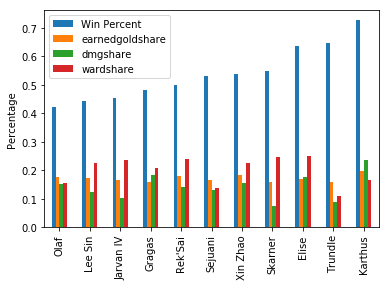

In [23]:
jg.sort_values('Win Percent').plot.bar()
plt.ylabel("Percentage")
plt.show()

### Champion stats for the position support

The support position is tasked with vision control and enabling the ADC and other roles through buffs. Once again, the highest win percentage, Pyke, is from a smaller sample size. However, unlike some other roles two of the most played heroes are also among the most successful. Rakan is strong as a standard healer while Tahm Kench has an ultimate that provides motility to teammates and a stun.

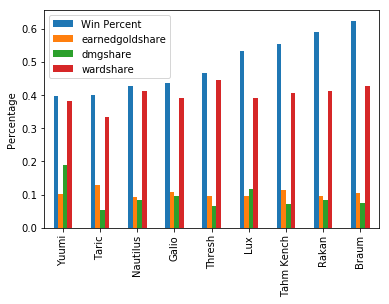

In [24]:
sup.sort_values('Win Percent').plot.bar()
plt.ylabel("Percentage")
plt.show()

Overall there are some champions such as Sylas and Varus that are used frequently and yield a high win rate. However, it seems that often the most successful picks are situational and while not outright the strongest at their position can be slotted into a team that synergizes with them or as a counter pick that allows them to take advantage of the other team’s weaknesses. This is a testament to the fluid nature of the game and that while some champions are overall strong at certain points in time there is generally room for counter play, meaning that the game is well designed and balanced, and that ingenuity will prevail over spamming “meta picks”.

In [25]:
from sklearn.model_selection import train_test_split
from scipy.stats import f
import seaborn as sns
from sklearn import model_selection
from sklearn import linear_model
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
import statsmodels.formula.api as smf
import warnings
from sklearn.model_selection import KFold
warnings.filterwarnings('ignore')
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics
from sklearn import datasets, linear_model
from mpl_toolkits import mplot3d

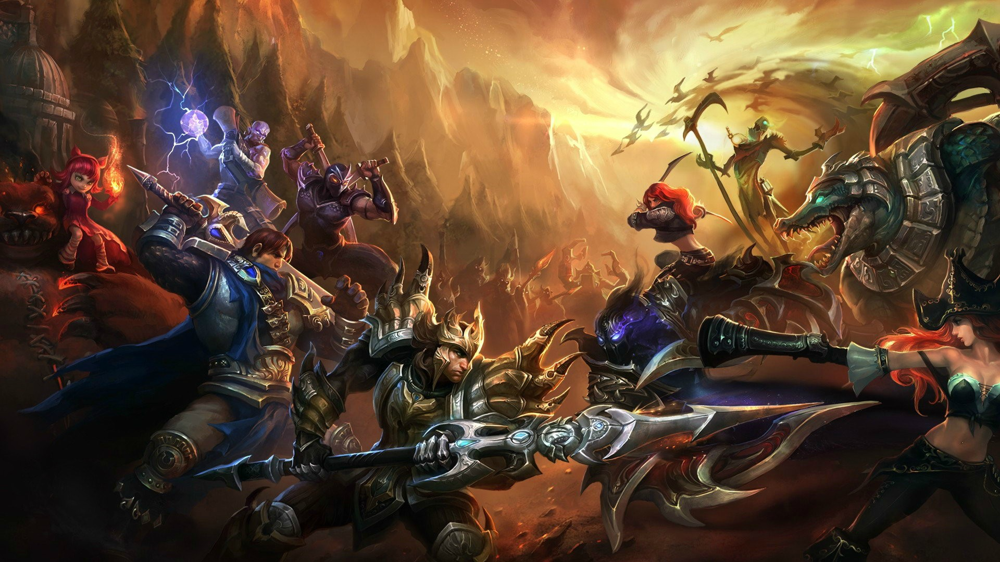

# Supervised Machine Learning [The Metagame]
### We did supervised machine learning on seven groups of gameplay factors to determine win percentage:
1. champion kills 
    - kpm = kills per minute
    - teamkills = champion kills made by team
    - a = assists, assisted kills
2. not dying
    - teamdeaths = number of total deaths by team
3. large monster kills
    - teamdragkills = Total dragons killed by team.
    - herald = Rift herald taken (1 yes, 0 opponent took it, blank herald not killed).
    - fbaron = First baron of game killed (1 yes, 0 no).
    - teambaronkills = Total barons killed by team.
4. tower kills
    - ft = First tower of game killed (1 yes, 0 no).
    - firstmidouter = First team to kill mid lane outer tower (1 yes, 0 no).
    - firsttothreetowers = First team to kill three towers (1 yes, 0 no).
    - teamtowerkills = Total towers killed by team.
    - fttime = First tower kill time, in minutes. 
5. creep score
    - minionkills = Lane minions killed.
    - monsterkills = Neutral monsters killed.
    - cspm = Creep score per minute. All creep score variables include minions and monsters.
    - csat10 = Creep score at 10:00.
    - csdat10 = Creep score difference at 10:00.
6. vision
    - wards = Total wards placed (of all types).
    - wpm = Wards placed per minute (or all types).
    - wardkills = Total wards cleared/killed (of all types).
    - wcpm = Total wards cleared/killed per minute (of all types).
    - visionwards = Vision/control wards placed.
    - visionwardbuys = Vision/control wards purchased.
7. economics
    - totalgold = Total gold earned from all sources.
    - earnedgpm = Earned gold per minute.
    - goldspent = Total gold spent.
    - gspd = Gold spent percentage difference.
    - goldat10 = Total gold earned at 10:00.
    - gdat10 = Gold difference at 10:00.
    - goldat15 = Total gold earned at 15:00.
    - gdat15 = Gold difference at 15:00.

## Tidy our data for machine learning
### As a reminder, all our data is grouped by teams. 
### As a result, the different teams in our dataset serve as the index for the dataframe. This will make a difference when looking at distributions of win percentages in the machine learning section, where the distribution will show the average number of teams on the y-axis and the win percentage on the x-axis.
Reference for gameplay factors: http://oracleselixir.com/match-data/match-data-dictionary/

In [92]:
by_team_data = data.loc[less_data['player'] == 'Team']
by_team_data.fillna(0, inplace = True)
team_data = by_team_data.groupby(['team']).mean()
result = team_data[['result']]

In [93]:
team_data.head()

,week,game,patchno,playerid,gamelength,result,k,d,a,teamkills,...,gdat15,xpat10,oppxpat10,xpdat10,csat10,oppcsat10,csdat10,csat15,oppcsat15,csdat15
team,,,,,,,,,,,,,,,,,,,,,
100 Thieves,2.500000,1.625000,9.110000,150.000000,34.847917,0.375000,9.625000,12.125000,26.000000,9.625000,...,-2254.625000,18223.000000,18705.375000,-482.375000,287.375000,320.625000,-33.250000,450.875000,509.000000,-58.1250
AHQ e-Sports Club,1.925000,1.875000,9.117500,150.000000,36.662500,0.625000,12.625000,9.125000,29.500000,12.625000,...,1292.625000,18590.375000,18360.500000,229.875000,316.375000,317.000000,-0.625000,508.250000,497.250000,11.0000
Afreeca Freecs,2.275000,1.875000,9.113125,150.000000,33.570833,0.500000,12.312500,12.312500,28.750000,12.312500,...,130.812500,18476.437500,18545.875000,-69.437500,324.437500,309.500000,14.937500,494.500000,481.187500,13.3125
Alpha Esports,1.885714,1.714286,9.117143,157.142857,29.338095,0.428571,9.000000,11.142857,23.142857,9.000000,...,-298.571429,18245.571429,19069.428571,-823.857143,305.285714,319.142857,-13.857143,481.714286,501.714286,-20.0000
Bilibili Gaming,2.916667,1.750000,9.102500,133.333333,31.320833,0.500000,11.416667,13.000000,29.000000,11.416667,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000


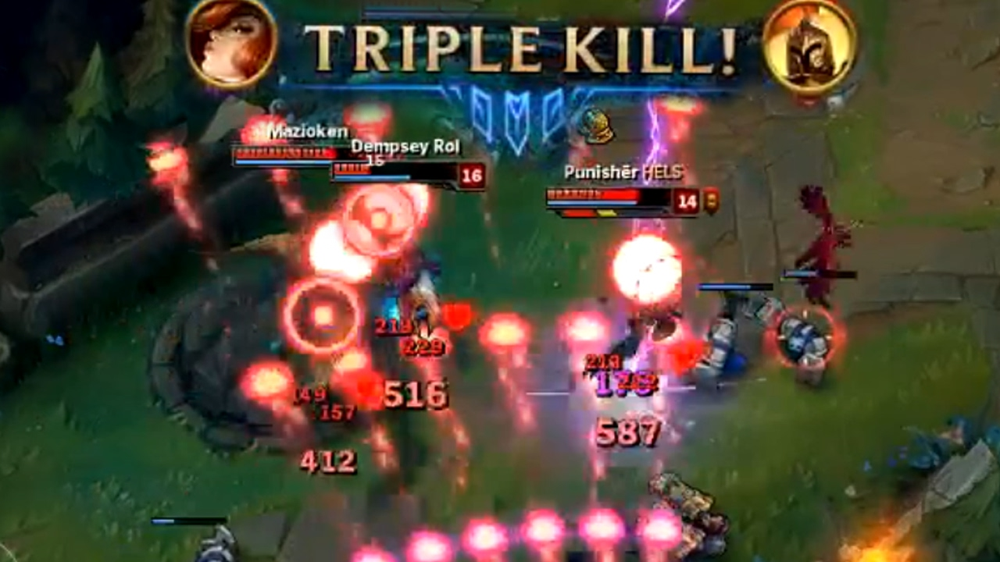

### 1. Win Percentage based on Champion Kills
#### We pick the three factors that influence "Champion Kills": 
    - kpm (kills per minute)
    - teamkills (total kills by team)
    - a (assisted kills by teammates)
With these three factors, we run a linear regression to fit the data.

In [94]:
# champ_kills is a sub-dataframe of team_data based on the Champion Kills factors.
champ_kills = team_data[['kpm','teamkills','a']]
# Set X as champion kills features
X = champ_kills
# set our win_percentage as y
y = result
# Split data into Train and Test
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y)
# run the linear regression on the training set using sklearn library
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)

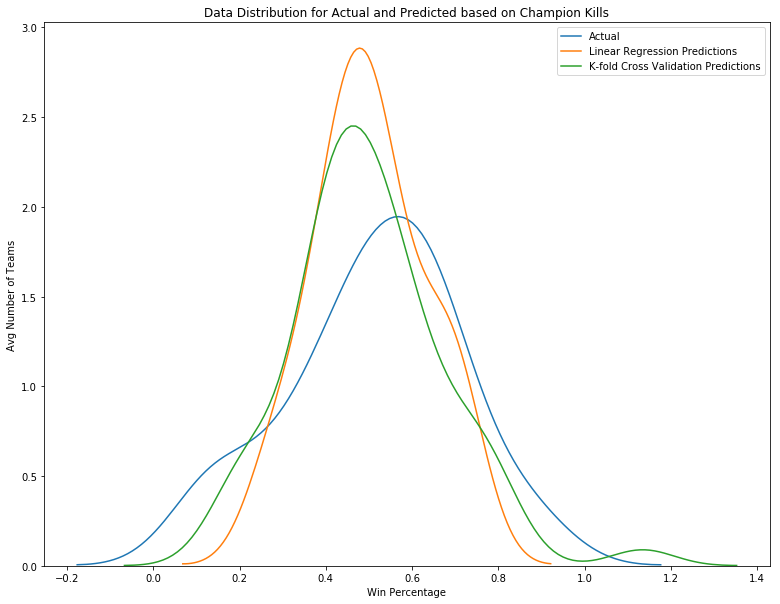

In [95]:
# run the linear regression on the training set using statsmodel library
champ_kills_LRM = smf.OLS(y_train, X_train).fit()

# Predict win percentage using our regression model on the Test data
preds_champKillsLRM = champ_kills_LRM.predict(X_test)
# Predict win percentage using K-fold cross validation on the Test data
KFCV_predictions = cross_val_predict(model, X, y, cv=5)

# Plot the predicted values (linear regression, k-fold cross validation) against the actual values
f, ax = plt.subplots(figsize=(13,10))
plt.title('Data Distribution for Actual and Predicted based on Champion Kills')
# plot actual values for win_percentage
sns.distplot(y_test, hist=False, label="Actual", ax=ax)
# plot linear regression values for win_percentage
sns.distplot(preds_champKillsLRM, hist=False, label="Linear Regression Predictions", ax=ax)
# plot linear regression values for k-fold cross validation
sns.distplot(KFCV_predictions, hist=False, label="K-fold Cross Validation Predictions", ax=ax)
ax.set(xlabel="Win Percentage", ylabel="Avg Number of Teams")
plt.show()

#### Champion Kills Statistics
- The R-squared value shows that over 90% of the variance is explained by the factor of champion kills.
- Of the factors analyzed (killsPerMinute, teamkills, assists), only kpm "kills per minute" came out as statistically relevant because of its low p-value.

In [96]:
champ_kills_LRM.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 result   R-squared:                       0.911
Model:                            OLS   Adj. R-squared:                  0.905
Method:                 Least Squares   F-statistic:                     143.6
Date:                Sat, 20 Jul 2019   Prob (F-statistic):           4.21e-22
Time:                        00:44:02   Log-Likelihood:                 17.956
No. Observations:                  45   AIC:                            -29.91
Df Residuals:                      42   BIC:                            -24.49
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
kpm            1.4370      0.811      1.772      0.084      -0.200       3.073
teamkills     -0.0057      0.053     -0.108      0.915      -0.113       0.101
a              0.0017      0.016      0.108      0.914      -0.030       0.034
==============================================================================
Omnibus:                        2.085   Durbin-Watson:                   1.457
Prob(Omnibus):                  0.353   Jarque-Bera (JB):                1.762
Skew:                          -0.347   Prob(JB):                        0.414
Kurtosis:                       2.324   Cond. No.                         994.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

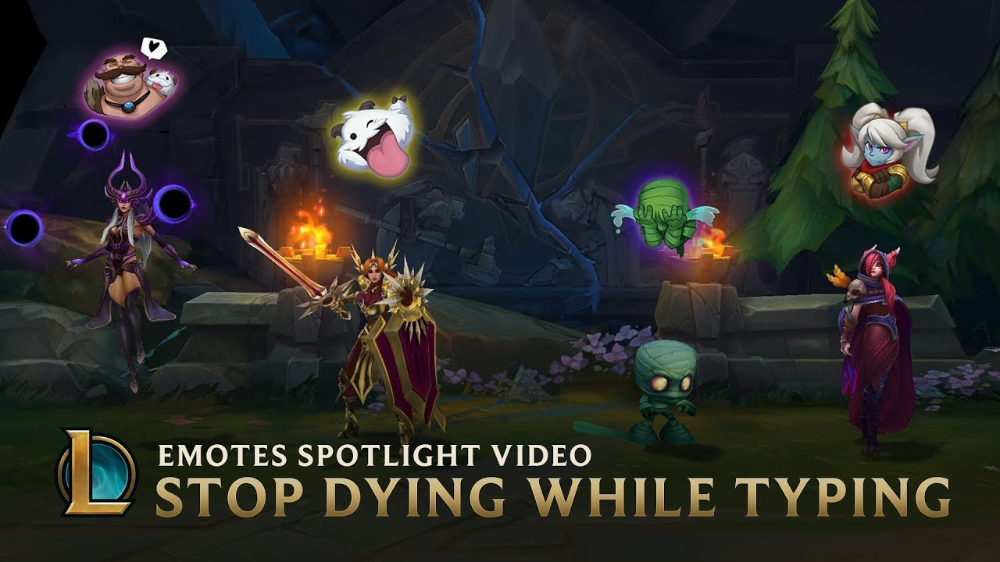

### 2. Win Percentage based on Not Dying
#### We pick the single factor that influences "Not Dying": 
    - teamdeaths (the number of times team members have died)
With this single factor, we run a linear regression to fit the data.

In [97]:
# not_dying is a sub-dataframe of team_data based on the Champion Kills factors.
not_dying = team_data[['teamdeaths']]
# Set X as not_dying dataframe
X = not_dying

# y is already set as our win_percentage

# Split data into Train and Test
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y)

# run the linear regression on the training set using sklearn library
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)

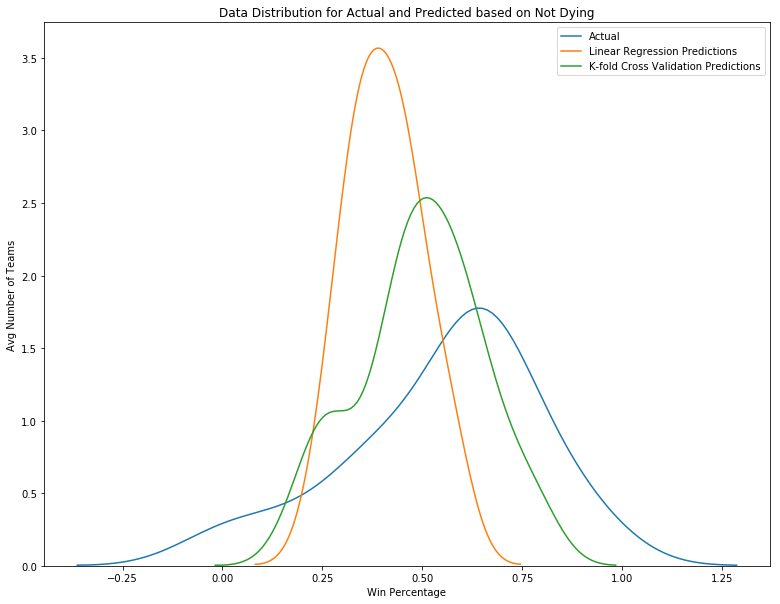

In [98]:
# run the linear regression on the training set using statsmodel library
notDying_LRM = smf.OLS(y_train, X_train).fit()

# Predict win percentage using our regression model on the Test data
preds_lr = notDying_LRM.predict(X_test)
# Predict win percentage using K-fold cross validation on the Test data
KFCV_predictions = cross_val_predict(model, X, y, cv=5)

# Plot the predicted values (linear regression, k-fold cross validation) against the actual values
f, ax = plt.subplots(figsize=(13,10))
plt.title('Data Distribution for Actual and Predicted based on Not Dying')
# plot actual values for win_percentage
sns.distplot(y_test, hist=False, label="Actual", ax=ax)
# plot linear regression values for win_percentage
sns.distplot(preds_lr, hist=False, label="Linear Regression Predictions", ax=ax)
# plot linear regression values for k-fold cross validation
sns.distplot(KFCV_predictions, hist=False, label="K-fold Cross Validation Predictions", ax=ax)
ax.set(xlabel="Win Percentage", ylabel="Avg Number of Teams")
plt.show()

#### Not Dying Statistics
- The R-squared value shows that only about 70% of the variance is explained by the factor of not dying.
- teamdeaths came out as statistically relevant because of its low p-value.

In [99]:
notDying_LRM.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 result   R-squared:                       0.707
Model:                            OLS   Adj. R-squared:                  0.700
Method:                 Least Squares   F-statistic:                     106.1
Date:                Sat, 20 Jul 2019   Prob (F-statistic):           2.66e-13
Time:                        00:44:03   Log-Likelihood:                -7.3045
No. Observations:                  45   AIC:                             16.61
Df Residuals:                      44   BIC:                             18.42
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
teamdeaths     0.0361      0.004     10.300      0.000       0.029       0.043
==============================================================================
Omnibus:                        0.148   Durbin-Watson:                   1.385
Prob(Omnibus):                  0.929   Jarque-Bera (JB):                0.350
Skew:                          -0.065   Prob(JB):                        0.839
Kurtosis:                       2.588   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

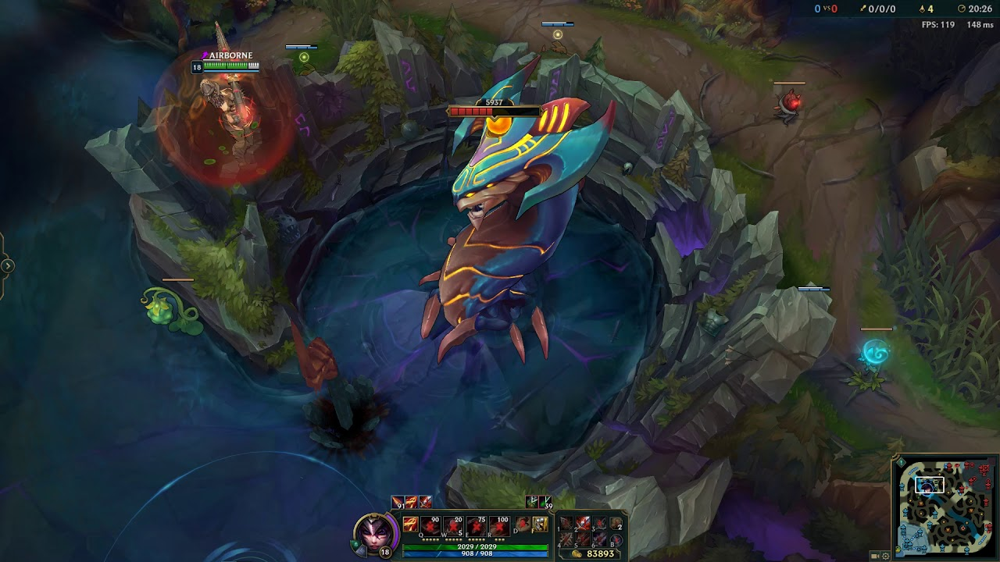

### 3. Win Percentage based on Large Monster Kills
#### We pick the multiple factors that influences "large monster kills"
    teamdragkills = Total dragons killed by team.
    herald = Rift herald taken (1 yes, 0 opponent took it, blank herald not killed).
    fbaron = First baron of game killed (1 yes, 0 no).
    teambaronkills = Total barons killed by team.
    heraldtime = Herald kill time, in minutes.
    fbarontime = First baron time, in minutes.
With these multiple factors, we run a linear regression to fit the data.
* herald, dragon and baron all refer to large monsters that reside in the jungle.

In [100]:
# largeMonsterKills is a sub-dataframe of team_data based on the "Large Monster Kills" factors.
largeMonsterKills = team_data[['teamdragkills','herald','heraldtime','fbaron','fbarontime','teambaronkills']]
# Set X as largeMonsterKills dataframe
X = largeMonsterKills

# y is already set as our win_percentage

# Split data into Train and Test
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y)
# run the linear regression on the training set using sklearn library
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)

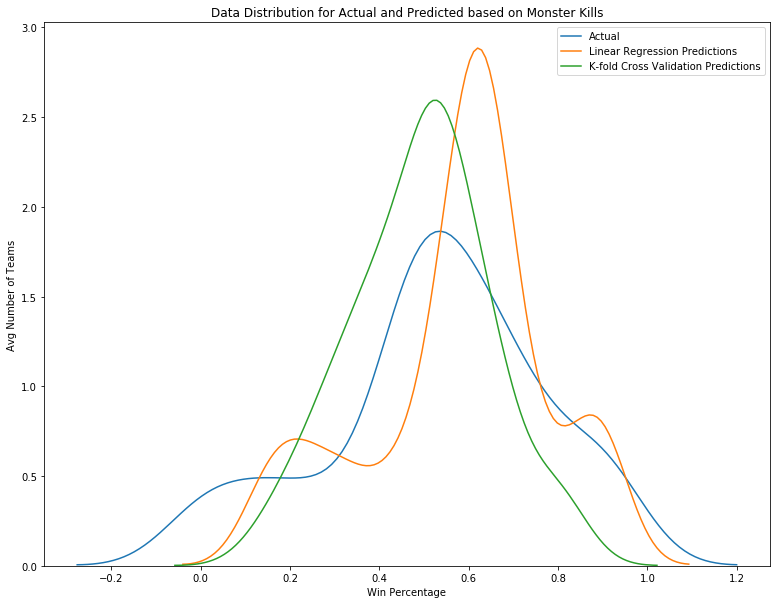

In [101]:
# run the linear regression on the training set using statsmodel library
largeMonsterKillsLRM = smf.OLS(y_train, X_train).fit()

# Predict win percentage using our regression model on the Test data
preds_lr = largeMonsterKillsLRM.predict(X_test)
# Predict win percentage using K-fold cross validation on the Test data
KFCV_predictions = cross_val_predict(model, X, y, cv=5)

# Plot the predicted values (linear regression, k-fold cross validation) against the actual values
f, ax = plt.subplots(figsize=(13,10))
plt.title('Data Distribution for Actual and Predicted based on Monster Kills')
# plot actual values for win_percentage
sns.distplot(y_test, hist=False, label="Actual", ax=ax)
# plot linear regression values for win_percentage
sns.distplot(preds_lr, hist=False, label="Linear Regression Predictions", ax=ax)
# plot linear regression values for k-fold cross validation
sns.distplot(KFCV_predictions, hist=False, label="K-fold Cross Validation Predictions", ax=ax)
ax.set(xlabel="Win Percentage", ylabel="Avg Number of Teams")
plt.show()

#### Large Monster Kills Statistics
- The R-squared value shows that over 85% of the variance is explained by the factor of large monster kills.
- Of the factors analyzed (teamdragkills, herald, fbaron, teambaronkills), 
only teamdragkills (number of dragons killed by team) came out as statistically relevant because of its low p-value.

In [102]:
largeMonsterKillsLRM.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 result   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.904
Method:                 Least Squares   F-statistic:                     71.29
Date:                Sat, 20 Jul 2019   Prob (F-statistic):           1.78e-19
Time:                        00:44:04   Log-Likelihood:                 20.310
No. Observations:                  45   AIC:                            -28.62
Df Residuals:                      39   BIC:                            -17.78
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
teamdragkills      0.2206      0.020     10.776      0.000       0.179       0.262
herald            -0.0375      0.164     -0.229      0.820      -0.368       0.293
heraldtime         0.0328      0.018      1.853      0.072      -0.003       0.069
fbaron             0.1693      0.293      0.577      0.567      -0.424       0.762
fbarontime        -0.0239      0.009     -2.787      0.008      -0.041      -0.007
teambaronkills     0.2229      0.221      1.008      0.320      -0.224       0.670
==============================================================================
Omnibus:                        0.110   Durbin-Watson:                   1.747
Prob(Omnibus):                  0.946   Jarque-Bera (JB):                0.314
Skew:                          -0.048   Prob(JB):                        0.855
Kurtosis:                       2.602   Cond. No.                         327.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

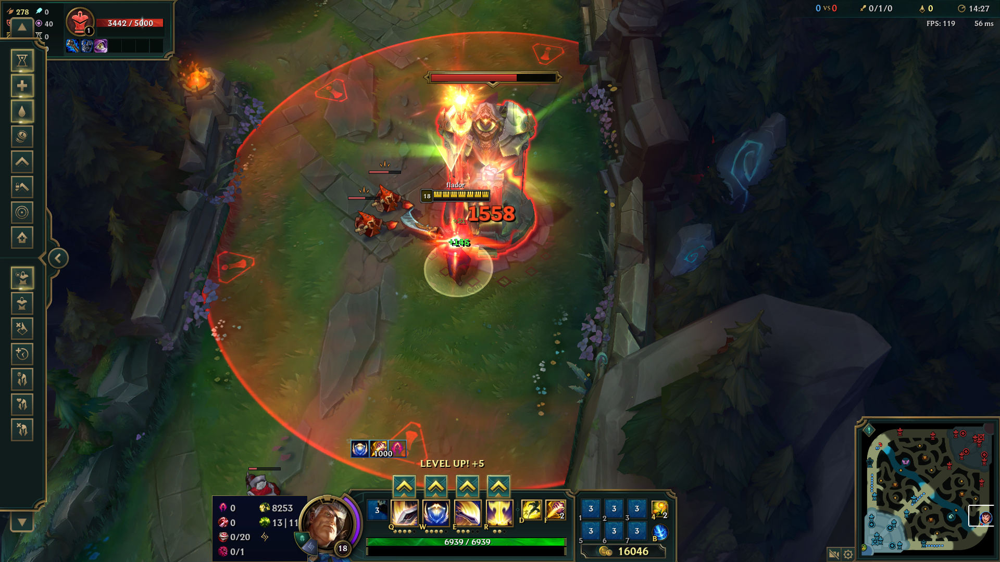

### 4. Win Percentage based on Tower Kills
#### The factors that influence Tower Kills: 
    tower kills
    ft = First tower of game killed (1 yes, 0 no).
    firstmidouter = First team to kill mid lane outer tower (1 yes, 0 no).
    firsttothreetowers = First team to kill three towers (1 yes, 0 no).
    teamtowerkills = Total towers killed by team.
    fttime = First tower kill time, in minutes.
With these factors, we run a linear regression to fit the data.

In [103]:
# tower_kills is a sub-dataframe of team_data based on the "tower kills" factors.
tower_kills = team_data[['ft','firstmidouter','firsttothreetowers','teamtowerkills','fttime']]
# Set X as tower_kills dataframe, # y is already set as our win_percentage
X = tower_kills
# Split data into Train and Test
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y)
# run the linear regression on the training set using sklearn library
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)

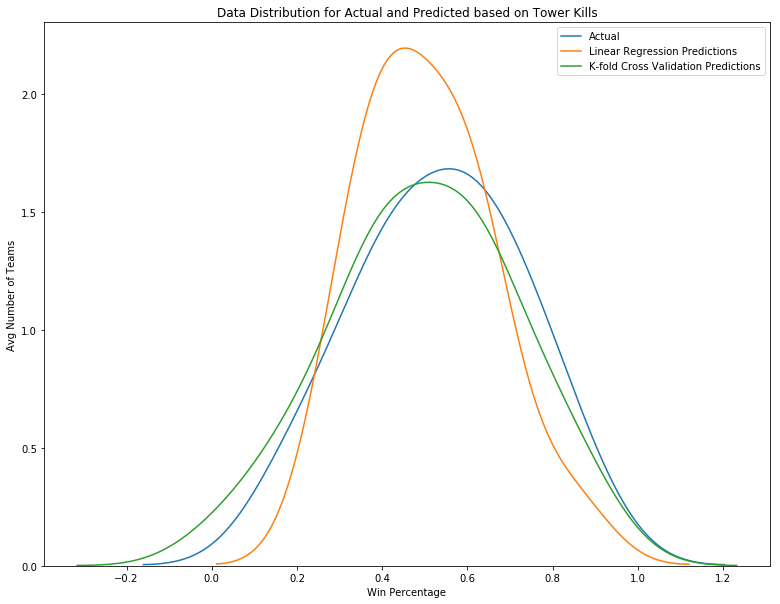

In [104]:
# run the linear regression on the training set using statsmodel library
towerKillsLRM = smf.OLS(y_train, X_train).fit()

# Predict win percentage using our regression model on the Test data
preds_lr = towerKillsLRM.predict(X_test)
# Predict win percentage using K-fold cross validation on the Test data
KFCV_predictions = cross_val_predict(model, X, y, cv=5)

# Plot the predicted values (linear regression, k-fold cross validation) against the actual values
f, ax = plt.subplots(figsize=(13,10))
plt.title('Data Distribution for Actual and Predicted based on Tower Kills')
# plot actual values for win_percentage
sns.distplot(y_test, hist=False, label="Actual", ax=ax)
# plot linear regression values for win_percentage
sns.distplot(preds_lr, hist=False, label="Linear Regression Predictions", ax=ax)
# plot linear regression values for k-fold cross validation
sns.distplot(KFCV_predictions, hist=False, label="K-fold Cross Validation Predictions", ax=ax)
ax.set(xlabel="Win Percentage", ylabel="Avg Number of Teams")
plt.show()

#### Tower Kills Statistics
- The R-squared value shows that above 95% of the variance is explained by the factor of tower kills.
- Of the factors analyzed (ft, firstmidouter, firsttothreetowers, teamtowerkills, fttime), 
only teamtowerkills & fttime came out as statistically relevant because of their low p-value's.

In [105]:
towerKillsLRM.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 result   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     268.0
Date:                Sat, 20 Jul 2019   Prob (F-statistic):           1.24e-29
Time:                        00:44:05   Log-Likelihood:                 43.726
No. Observations:                  45   AIC:                            -77.45
Df Residuals:                      40   BIC:                            -68.42
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
ft                    -0.0761      0.122     -0.622      0.537      -0.323       0.171
firstmidouter         -0.1360      0.162     -0.838      0.407      -0.464       0.192
firsttothreetowers     0.3531      0.158      2.232      0.031       0.033       0.673
teamtowerkills         0.0898      0.005     19.248      0.000       0.080       0.099
fttime                -0.0082      0.004     -2.115      0.041      -0.016      -0.000
==============================================================================
Omnibus:                        5.909   Durbin-Watson:                   1.894
Prob(Omnibus):                  0.052   Jarque-Bera (JB):                4.836
Skew:                          -0.600   Prob(JB):                       0.0891
Kurtosis:                       4.067   Cond. No.                         199.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

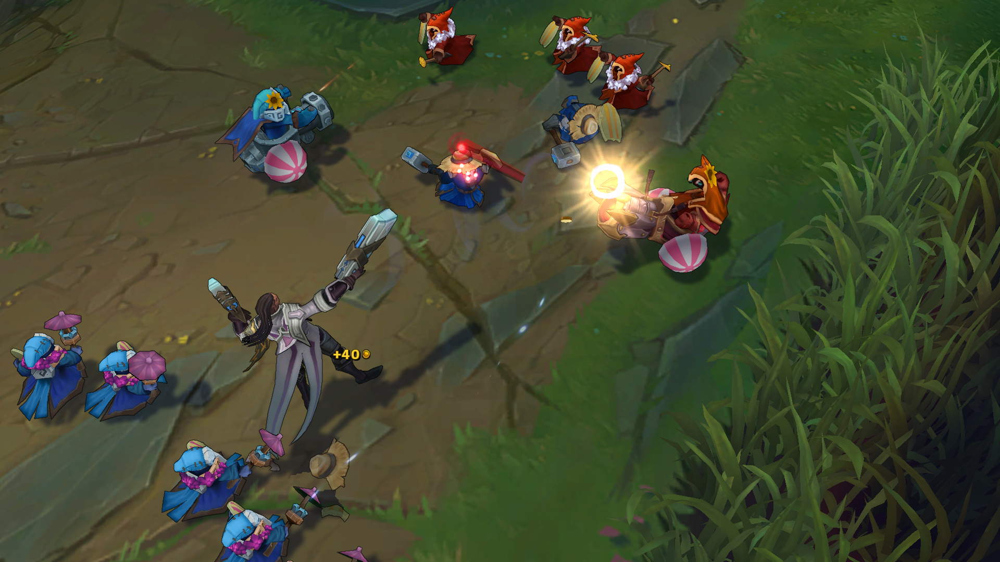

### 5. Win Percentage based on Creep Score
#### We pick the multiple factors that influences Creep Score
    creep score
    minionkills = Lane minions killed.
    monsterkills = Neutral monsters killed.
    cspm = Creep score per minute. All creep score variables include minions and monsters.
    csat10 = Creep score at 10:00.
    csdat10 = Creep score difference at 10:00.
With these multiple factors, we run a linear regression to fit the data.

In [106]:
# minion_kills is a sub-dataframe of team_data based on the "Large Monster Kills" factors.
minion_kills = team_data[['minionkills','monsterkills','cspm','csat10','csdat10']]
# Set X as largeMonsterKills dataframe
# y is already set as our win_percentage
X = minion_kills
# Split data into Train and Test
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y)
# run the linear regression on the training set using sklearn library\
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)

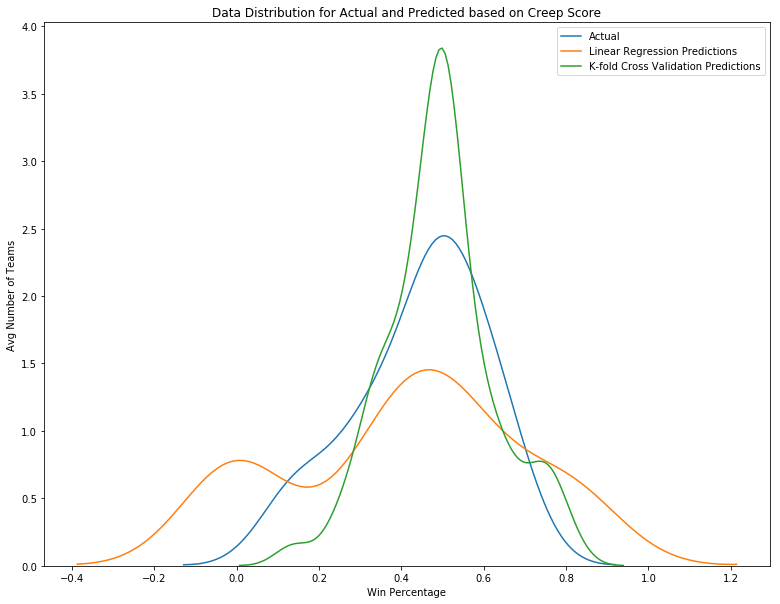

In [107]:
# run the linear regression on the training set using statsmodel library
minionKillsLRM = smf.OLS(y_train, X_train).fit()

# Predict win percentage using our regression model on the Test data
preds_lr = minionKillsLRM.predict(X_test)
# Predict win percentage using K-fold cross validation on the Test data
KFCV_predictions = cross_val_predict(model, X, y, cv=5)

# Plot the predicted values (linear regression, k-fold cross validation) against the actual values
f, ax = plt.subplots(figsize=(13,10))
plt.title('Data Distribution for Actual and Predicted based on Creep Score')
# plot actual values for win_percentage
sns.distplot(y_test, hist=False, label="Actual", ax=ax)
# plot linear regression values for win_percentage
sns.distplot(preds_lr, hist=False, label="Linear Regression Predictions", ax=ax)
# plot linear regression values for k-fold cross validation
sns.distplot(KFCV_predictions, hist=False, label="K-fold Cross Validation Predictions", ax=ax)
ax.set(xlabel="Win Percentage", ylabel="Avg Number of Teams")
plt.show()

#### Minion Kills Statistics
- The R-squared value shows that only about 70% of the variance is explained by the factor of creep score.
- Of the factors analyzed (minionkills, monsterkills, cspm, csat10, csdat10), 
minionkills and monsterkills came out as statistically relevant because of their low p-value's.

In [108]:
minionKillsLRM.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 result   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.635
Method:                 Least Squares   F-statistic:                     16.64
Date:                Sat, 20 Jul 2019   Prob (F-statistic):           7.17e-09
Time:                        00:44:06   Log-Likelihood:                -13.206
No. Observations:                  45   AIC:                             36.41
Df Residuals:                      40   BIC:                             45.45
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
minionkills     -0.0020      0.001     -1.654      0.106      -0.004       0.000
monsterkills     0.0060      0.005      1.248      0.219      -0.004       0.016
cspm             0.0828      0.065      1.266      0.213      -0.049       0.215
csat10          -0.0050      0.007     -0.727      0.471      -0.019       0.009
csdat10          0.0053      0.005      1.019      0.314      -0.005       0.016
==============================================================================
Omnibus:                        8.209   Durbin-Watson:                   1.409
Prob(Omnibus):                  0.016   Jarque-Bera (JB):                8.121
Skew:                           1.040   Prob(JB):                       0.0172
Kurtosis:                       3.075   Cond. No.                     1.07e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.07e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

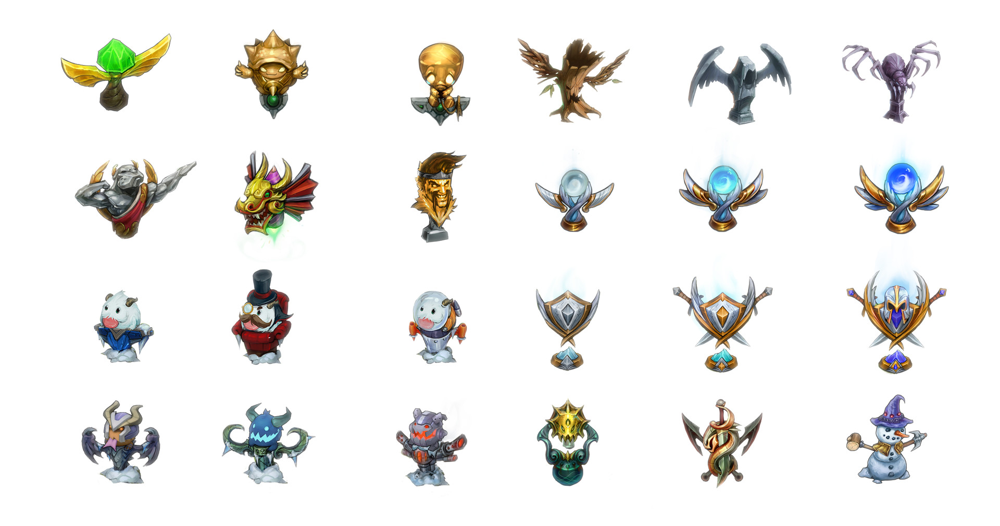

### 6. Win Percentage based on Vision (Warding)
- Wards are basically little lightposts that you can plant on the map. They will last for a few minutes before they burn out. They provide vision to your team outside of the base.
- The above picture shows different custom ward skins (designs) that are available to players.

#### We pick the multiple factors that influences Vision
    wards = Total wards placed (of all types).
    wpm = Wards placed per minute (or all types).
    wardkills = Total wards cleared/killed (of all types).
    wcpm = Total wards cleared/killed per minute (of all types).
    visionwards = Vision/control wards placed.
    visionwardbuys = Vision/control wards purchased.
With these multiple factors, we run a linear regression to fit the data.

In [109]:
# vision is a sub-dataframe of team_data based on the "vision" factors.
vision = team_data[['wards','wpm','wardkills','wcpm','visionwards','visionwardbuys']]
# Set X as largeMonsterKills dataframe, # y is already set as our win_percentage
X = vision
# Split data into Train and Test
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y)
# run the linear regression on the training set using sklearn library
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)

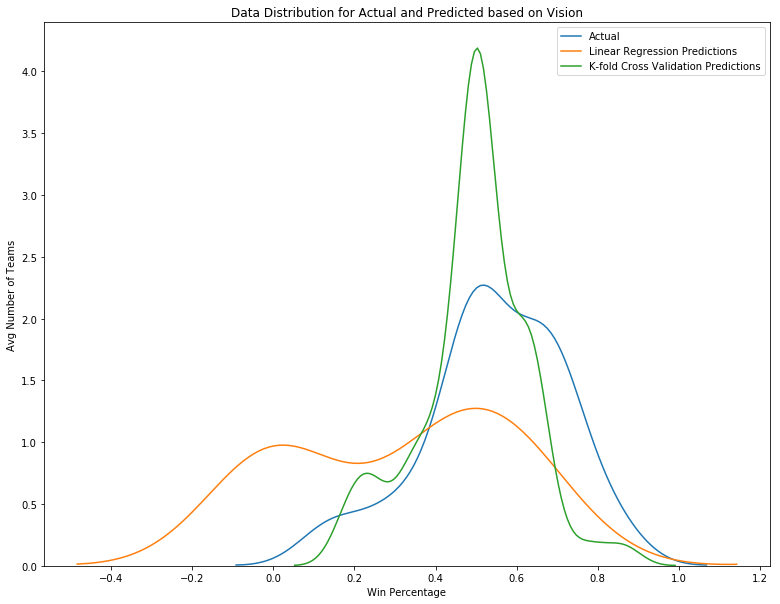

In [110]:
# Fit the Linear Regression on Train split
visionLRM = smf.OLS(y_train, X_train).fit()

# Predict using Test split
preds_lr = visionLRM.predict(X_test)
KFCV_predictions = cross_val_predict(model, X, y, cv=5)

# Plot how the predicted win_ratio compares to actual win ratio
f, ax = plt.subplots(figsize=(13,10))
plt.title('Data Distribution for Actual and Predicted based on Vision')
sns.distplot(y_test, hist=False, label="Actual", ax=ax)
sns.distplot(preds_lr, hist=False, label="Linear Regression Predictions", ax=ax)
sns.distplot(KFCV_predictions, hist=False, label="K-fold Cross Validation Predictions", ax=ax)
ax.set(xlabel="Win Percentage", ylabel="Avg Number of Teams")
plt.show()

#### Vision Statistics
- The R-squared value shows that only about 65% of the variance is explained by the factor of vision.
- Of the factors analyzed (wards, wpm, wardkills, wcpm, visionwards, visionwardbuys), 
only visionwards came out as statistically relevant because of its low p-value.

In [111]:
visionLRM.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 result   R-squared:                       0.715
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                     16.29
Date:                Sat, 20 Jul 2019   Prob (F-statistic):           2.78e-09
Time:                        00:44:07   Log-Likelihood:                -7.6282
No. Observations:                  45   AIC:                             27.26
Df Residuals:                      39   BIC:                             38.10
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
wards              0.0022      0.030      0.072      0.943      -0.059       0.063
wpm               -0.0907      1.084     -0.084      0.934      -2.283       2.101
wardkills         -0.0355      0.063     -0.561      0.578      -0.163       0.092
wcpm               1.5789      2.199      0.718      0.477      -2.869       6.027
visionwards        0.1105      0.058      1.909      0.064      -0.007       0.228
visionwardbuys    -0.1025      0.053     -1.935      0.060      -0.210       0.005
==============================================================================
Omnibus:                        8.793   Durbin-Watson:                   1.869
Prob(Omnibus):                  0.012   Jarque-Bera (JB):                7.936
Skew:                           0.972   Prob(JB):                       0.0189
Kurtosis:                       3.675   Cond. No.                     6.88e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.88e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

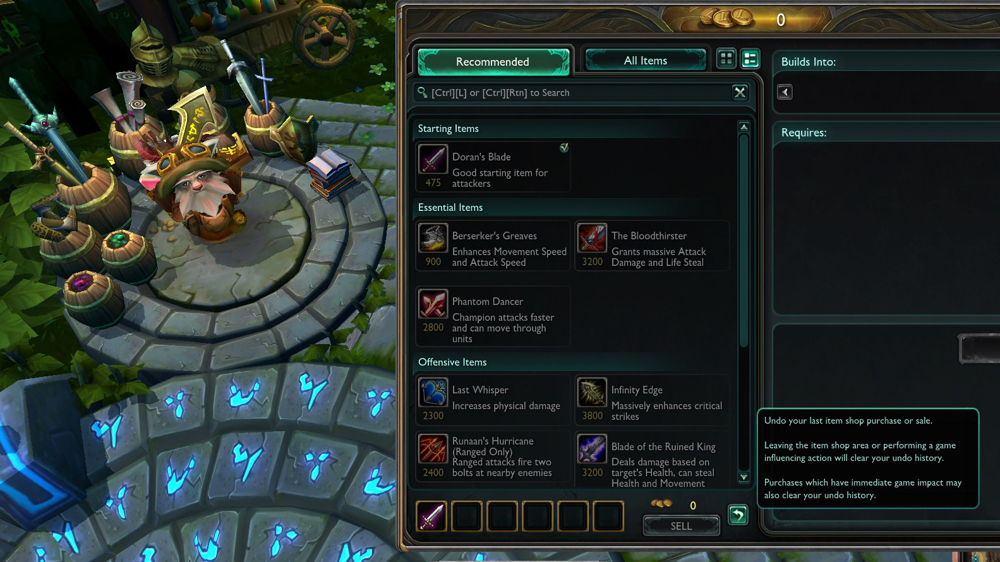

### 7. Win Percentage based on Economics
#### We pick the multiple factors that influences "Economics"
    totalgold = Total gold earned from all sources.
    earnedgpm = Earned gold per minute.
    goldspent = Total gold spent.
    gspd = Gold spent percentage difference.
    goldat10 = Total gold earned at 10:00.
    gdat10 = Gold difference at 10:00.
    goldat15 = Total gold earned at 15:00.
    gdat15 = Gold difference at 15:00.
With these multiple factors, we run a linear regression to fit the data.

In [112]:
# economics is a sub-dataframe of team_data based on the "Large Monster Kills" factors.
economics = team_data[['totalgold','earnedgpm','goldspent','gspd','goldat10','gdat10','goldat15','gdat15']]
# Set X as largeMonsterKills dataframe, # y is already set as our win_percentage
X = economics
# Split data into Train and Test
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y)
# run the linear regression on the training set using sklearn library
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)

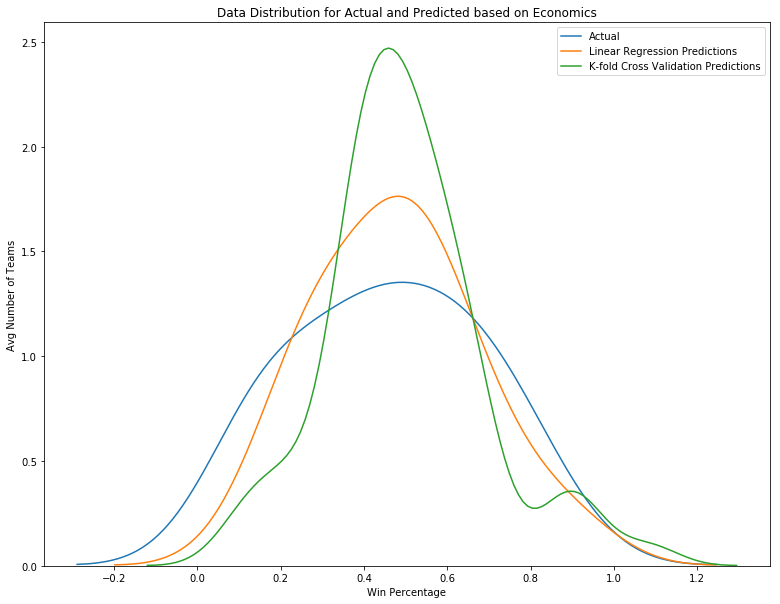

In [113]:
# run the linear regression on the training set using statsmodel library
econLRM = smf.OLS(y_train, X_train).fit()

# Predict win percentage using our regression model on the Test data
preds_lr = econLRM.predict(X_test)
# Predict win percentage using K-fold cross validation on the Test data
KFCV_predictions = cross_val_predict(model, X, y, cv=5)

# Plot the predicted values (linear regression, k-fold cross validation) against the actual values
f, ax = plt.subplots(figsize=(13,10))
plt.title('Data Distribution for Actual and Predicted based on Economics')
# plot actual values for win_percentage
sns.distplot(y_test, hist=False, label="Actual", ax=ax)
# plot linear regression values for win_percentage
sns.distplot(preds_lr, hist=False, label="Linear Regression Predictions", ax=ax)
# plot linear regression values for k-fold cross validation
sns.distplot(KFCV_predictions, hist=False, label="K-fold Cross Validation Predictions", ax=ax)
ax.set(xlabel="Win Percentage", ylabel="Avg Number of Teams")
plt.show()

#### Economics Statistics
- The R-squared value shows that over 90% of the variance is explained by the factor of economics.
- Of the factors analyzed (totalgold, earnedgpm, goldspent, gspd, goldat10, gdat10, goldat15, gdat15), 
only totalgold, earnedgpm & goldspent came out as statistically relevant because of their low p-value's.

In [114]:
econLRM.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 result   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.917
Method:                 Least Squares   F-statistic:                     62.82
Date:                Sat, 20 Jul 2019   Prob (F-statistic):           3.45e-19
Time:                        00:44:08   Log-Likelihood:                 22.649
No. Observations:                  45   AIC:                            -29.30
Df Residuals:                      37   BIC:                            -14.84
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
totalgold   8.782e-06   7.78e-07     11.289      0.000    7.21e-06    1.04e-05
earnedgpm      0.0017      0.001      1.983      0.055   -3.63e-05       0.003
goldspent  -1.303e-05   9.78e-06     -1.333      0.191   -3.28e-05    6.78e-06
gspd           0.5347      1.410      0.379      0.707      -2.322       3.391
goldat10    5.284e-05      0.000      0.364      0.718      -0.000       0.000
gdat10     -9.344e-06      0.000     -0.054      0.957      -0.000       0.000
goldat15   -8.152e-05   8.93e-05     -0.913      0.367      -0.000    9.93e-05
gdat15       5.25e-05    6.7e-05      0.784      0.438   -8.32e-05       0.000
==============================================================================
Omnibus:                        7.687   Durbin-Watson:                   1.808
Prob(Omnibus):                  0.021   Jarque-Bera (JB):                9.206
Skew:                          -0.501   Prob(JB):                       0.0100
Kurtosis:                       4.976   Cond. No.                     4.50e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.5e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

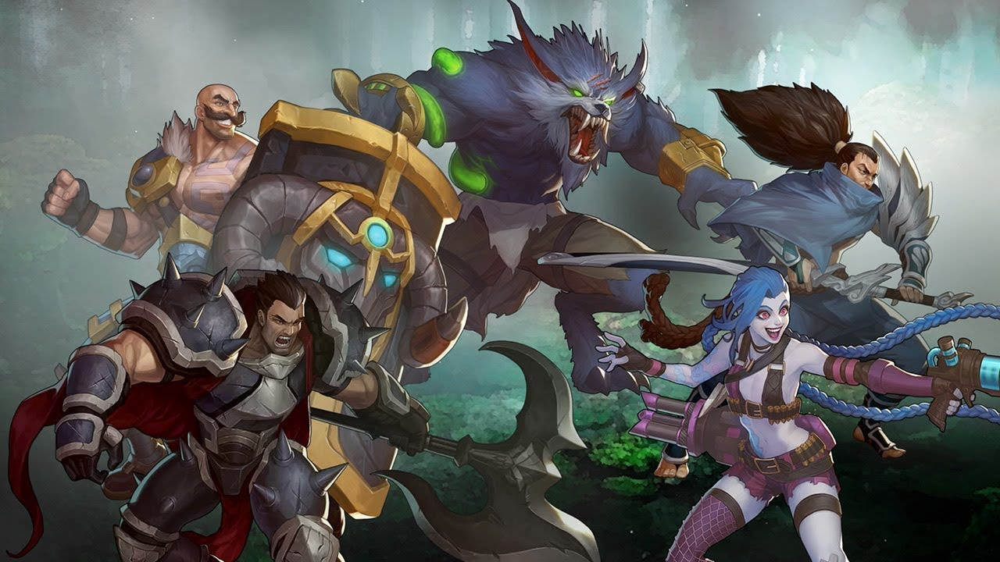

### Win Percentaged based on Most Relevant Factors
We will now create a more comprehensive linear regression model based on the most statistically relevant factors we encountered in the seven aforementioned linear regressions.

Most relevant groups of factors:
    - champion kills
    - large monster kills
    - tower kills
    - economics

Most relevant factors:
    - kpm
    - teamdeaths
    - teamdragkills
    - teamtowerkills
    - fttime
    - minionkills
    - monsterkills
    - visionwards
    - visionwardbuys
    - totalgold
    - earnedgpm
    - goldspent

In [115]:
# relevant is a sub-dataframe of team_data based on the most relevant factors.
relevant = team_data[['kpm', 'teamdeaths', 'teamdragkills', 'teamtowerkills', 'fttime', 'minionkills', 'monsterkills', 'visionwards', 'visionwardbuys', 'totalgold', 'earnedgpm', 'goldspent']]
# Set X as relevant dataframe, # y is already set as our win_percentage
X = relevant
# Split data into Train and Test
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y)
# run the linear regression on the training set using sklearn library
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)

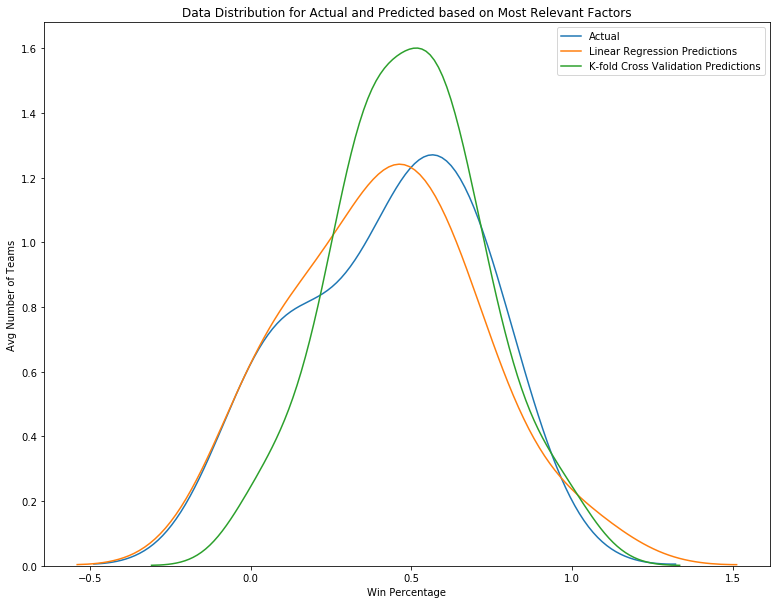

In [116]:
# run the linear regression on the training set using statsmodel library
relevantLRM = smf.OLS(y_train, X_train).fit()

# Predict win percentage using our regression model on the Test data
preds_lr = relevantLRM.predict(X_test)
# Predict win percentage using K-fold cross validation on the Test data
KFCV_predictions = cross_val_predict(model, X, y, cv=5)

# Plot the predicted values (linear regression, k-fold cross validation) against the actual values
f, ax = plt.subplots(figsize=(13,10))
plt.title('Data Distribution for Actual and Predicted based on Most Relevant Factors')
# plot actual values for win_percentage
sns.distplot(y_test, hist=False, label="Actual", ax=ax)
# plot linear regression values for win_percentage
sns.distplot(preds_lr, hist=False, label="Linear Regression Predictions", ax=ax)
# plot linear regression values for k-fold cross validation
sns.distplot(KFCV_predictions, hist=False, label="K-fold Cross Validation Predictions", ax=ax)
ax.set(xlabel="Win Percentage", ylabel="Avg Number of Teams")
plt.show()

In [117]:
relevantLRM.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 result   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     376.0
Date:                Sat, 20 Jul 2019   Prob (F-statistic):           1.14e-31
Time:                        00:44:09   Log-Likelihood:                 73.063
No. Observations:                  45   AIC:                            -122.1
Df Residuals:                      33   BIC:                            -100.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
kpm                0.5661      0.192      2.943      0.006       0.175       0.958
teamdeaths        -0.0274      0.005     -5.595      0.000      -0.037      -0.017
teamdragkills     -0.0309      0.020     -1.541      0.133      -0.072       0.010
teamtowerkills     0.0649      0.016      4.009      0.000       0.032       0.098
fttime             0.0254      0.011      2.220      0.033       0.002       0.049
minionkills       -0.0009      0.001     -1.734      0.092      -0.002       0.000
monsterkills       0.0008      0.001      0.737      0.466      -0.001       0.003
visionwards        0.0071      0.011      0.640      0.527      -0.016       0.030
visionwardbuys    -0.0039      0.011     -0.366      0.717      -0.025       0.018
totalgold       5.253e-06   2.25e-06      2.337      0.026     6.8e-07    9.83e-06
earnedgpm          0.0004      0.000      2.050      0.048    2.71e-06       0.001
goldspent      -4.523e-06   7.54e-06     -0.600      0.552   -1.99e-05    1.08e-05
==============================================================================
Omnibus:                       10.413   Durbin-Watson:                   1.386
Prob(Omnibus):                  0.005   Jarque-Bera (JB):               11.389
Skew:                          -0.818   Prob(JB):                      0.00336
Kurtosis:                       4.844   Cond. No.                     1.71e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.71e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Conclusion & Analysis
- The model based on the most relevant factors shown so far explains 99% of the variance in the data.
- Our accuracy score turned out very well, over 92%.
- Based on final comprehensive linear regression model, the gameplay factors most relevant to win_percentage based on p-values turned out to be kpm (kills per minute), teamdeaths (total number of times team members have died), teamtowerkills (the number of towers eliminated).
- So the statistically proven strategy is killing champions and towers as quickly as possible while not dying as much as possible.

A <b>follow-up analysis</b> would be to account for time relevant factors such as accomplishing certain objectives within a certain time frame (10, 15 minutes). 
Another route of follow-up analysis would be to include factors regarding <b>champion selection</b> and/or <b>item selection</b>. Since each champion and item is so unique in its own right and also because the data didn't include these factors, we reserved this analysis for possible follow-up.

### The accuracy score of our final comprehensive linear regression model

Score: 0.9300767348490233


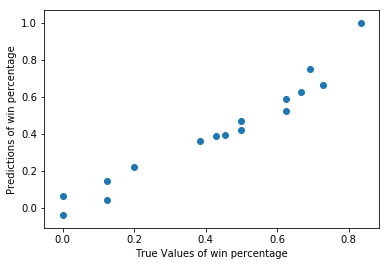

In [120]:
predictions = lm.predict(X_test)
plt.scatter(y_test, predictions)
plt.xlabel("True Values of win percentage")
plt.ylabel("Predictions of win percentage")
print("Score:", model.score(X_test, y_test))

### The accuracy score of our final comprehensive linear regression model based on 5-fold cross validation

Cross-validated scores: [0.83183106 0.96973406 0.89237215 0.92811649 0.89840953]
Cross-Predicted Accuracy: 0.9235959952857985


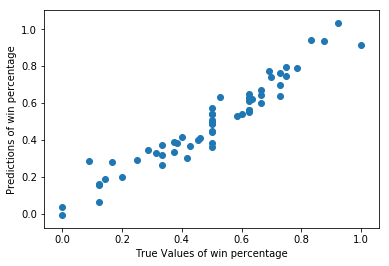

In [121]:
# Perform 5-fold cross validation
scores = cross_val_score(model, X, y, cv=5)
print("Cross-validated scores:", scores)

KFCV_predictions = cross_val_predict(model, X, y, cv=5)
plt.scatter(y, KFCV_predictions)

accuracy = metrics.r2_score(y, KFCV_predictions)
print("Cross-Predicted Accuracy:", accuracy)

plt.xlabel("True Values of win percentage")
plt.ylabel("Predictions of win percentage")
plt.show()